In [1]:
Pkg.add("QuadGK")
using Polynomials
using Plots
using QuadGK


  Updating registry at `/home/jrun/.julia/registries/JuliaPro`
  Updating git-repo `https://pkg.juliacomputing.com/registry/JuliaPro`
Fetching: [========================================>]  100.0 %.0 %13.7 %>                             ]  27.4 %                  ]  54.7 % [============================>            ]  68.4 %>      ]  82.8 %=======================================> ]  96.5 % Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]


┌ Info: Recompiling stale cache file /mnt/juliabox/.julia/compiled/v1.0/Plots/ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1184


In [2]:
function legendre(k)
    if k == 0
        return Poly([1])
    elseif k == 1
        return Poly([0, 1])
    else
        return ((2 * (k - 1) + 1) / ((k - 1) + 1)) * Poly([0, 1]) * legendre(k - 1) - ((k - 1) / ((k - 1) + 1)) * legendre(k - 2)
    end
end

legendre (generic function with 1 method)

In [ ]:
plot()

function drawLegendre(k)
    xs = -1:0.1:1
    p = legendre(k)
    ys = p(xs)
    plot!(xs, ys)
end



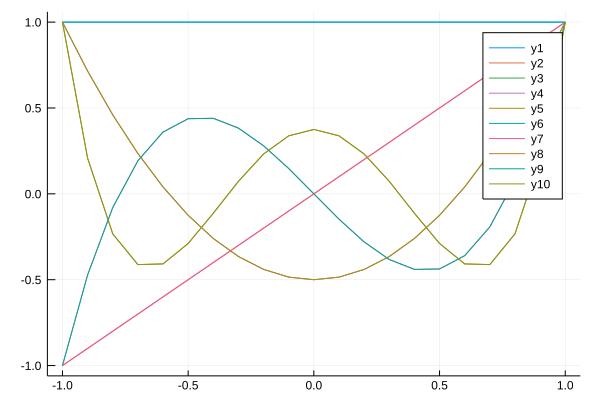

In [8]:
drawLegendre(0)
drawLegendre(1)
drawLegendre(2)
drawLegendre(3)
drawLegendre(4)



In [9]:
println(roots(legendre(2)))
println(gauss(Float64, 2))
println(roots(legendre(3)))
println(gauss(Float64, 3))
println(roots(legendre(4)))
println(gauss(Float64, 4))

[-0.57735, 0.57735]
([-0.57735, 0.57735], [1.0, 1.0])
[-0.774597, 0.774597, 0.0]
([-0.774597, 0.0, 0.774597], [0.555556, 0.888889, 0.555556])
[-0.861136, 0.861136, -0.339981, 0.339981]
([-0.861136, -0.339981, 0.339981, 0.861136], [0.347855, 0.652145, 0.652145, 0.347855])


In [11]:
#zad2
function integral(f, k)
    (xp, a) = gauss(Float64, k)
    return sum(a .* f.(xp))
end


integral (generic function with 1 method)

In [12]:
f1(x) = x
f2(x) = x^2
f3(x) = x^3
f4(x) = x^4

println("f(x) = x - Should be: 0.0")
for i = 1:8
    println(integral(f1, i))
end

println("\nf(x) = x^2 - Should be: 0.666667 (2/3)")
for i = 1:10
    println(integral(f2, i))
end

println("\nf(x) = x^3 - Should be: 0.0")
for i = 1:10
    println(integral(f3, i))
end

println("\nf(x) = x^4 - Should be: 0.4")
for i = 1:20
    println(integral(f4, i))
end

f(x) = x - Should be: 0.0
0.0
0.0
0.0
-5.551115123125783e-17
-2.7755575615628914e-17
-8.326672684688674e-17
-1.3877787807814457e-17
3.191891195797325e-16

f(x) = x^2 - Should be: 0.666667 (2/3)
0.0
0.6666666666666667
0.6666666666666667
0.666666666666667
0.6666666666666667
0.6666666666666669
0.6666666666666669
0.6666666666666666
0.6666666666666667
0.6666666666666667

f(x) = x^3 - Should be: 0.0
0.0
0.0
0.0
0.0
-2.7755575615628914e-17
-2.7755575615628914e-17
0.0
2.636779683484747e-16
1.3877787807814457e-17
2.7755575615628914e-17

f(x) = x^4 - Should be: 0.4
0.0
0.2222222222222223
0.4000000000000001
0.4000000000000002
0.4000000000000001
0.40000000000000013
0.40000000000000013
0.3999999999999998
0.4000000000000002
0.40000000000000013
0.4000000000000001
0.40000000000000013
0.4
0.40000000000000024
0.40000000000000024
0.40000000000000013
0.40000000000000013
0.40000000000000036
0.40000000000000036
0.40000000000000024


In [10]:
function integral_wrapper(f,a, b, x)
    return f(((b+a)/2 + (b-a)/2*x) * (b-a)/2)
end

integral_wrapper (generic function with 1 method)

In [11]:
    
function integral_a_b(f, a, b, k)
    (zp, c) = gauss(Float64, k)
    return sum(integral_wrapper(f, a, b, zp)*c .* zp)
end

integral_a_b (generic function with 1 method)

In [12]:
f1(x) = x
f2(x) = x^2
f3(x) = x^3
f4(x) = x^4

println("f(x) = x^2 - Integral from 1 to 2 Should be: 2.3333 (7/3)")
for i = 1:20
    println(integral_a_b(f2, 1, 2, i))
end



f(x) = x^2 - Integral from 1 to 2 Should be: 2.3333 (7/3)


MethodError: MethodError: no method matching +(::Float64, ::Array{Float64,1})
Closest candidates are:
  +(::Any, ::Any, !Matched::Any, !Matched::Any...) at operators.jl:502
  +(::Float64, !Matched::Float64) at float.jl:395
  +(::AbstractFloat, !Matched::Bool) at bool.jl:114
  ...

In [13]:
#zad4
f = Poly([1, 2, 3])

println(f)
println(quadgk(f, -1, 1))

gf(x) = 1 / sqrt(2* pi) * exp(-(x*x)/2)
println(quadgk(gf, -Inf, Inf))

Poly(1 + 2*x + 3*x^2)
(4.0, 4.440892098500626e-16)
(1.0000000000032583, 1.4395584941504537e-8)


In [14]:
#zad5 Funkcja całkująca metodą prostokątów
function integral(f, a, b, c)
    sum = 0.0

    for i = a:c:b
        sum += f(i) * c
    end

    return sum
end

integral (generic function with 2 methods)

Poly(1 + 2*x + 3*x^2)
(4.0, 4.440892098500626e-16)
4.00000400000099
[0.41, 0.0401, 0.004001]


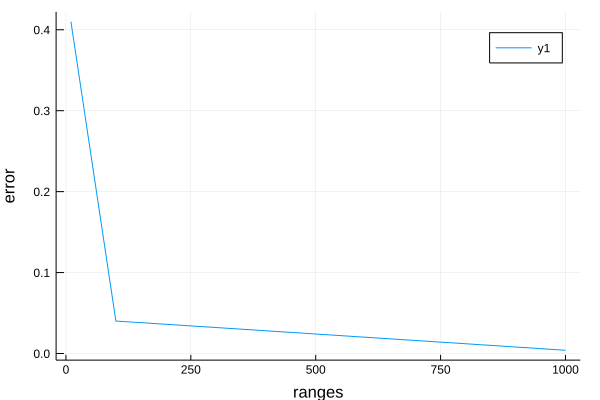

In [16]:
f = Poly([1, 2, 3])

println(f)
println(quadgk(f, -1, 1))
(value, err) = quadgk(f, -1, 1)
func(x) = 3*x*x + 2*x + 1

println(integral(func, -1, 1, 0.000001))

xs = [10 * x for x in [1,10,100]]
ys = [abs(value - integral(func, -1, 1, 1 / x)) for x in xs]
println(ys)
plot(xs, ys, xlabel="ranges", ylabel="error")